In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
!pip install textblob
from textblob import TextBlob
import plotly.graph_objects as go
from textblob import TextBlob
from textblob import Blobber
from textblob.sentiments import NaiveBayesAnalyzer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import nltk
nltk.download('movie_reviews')

[nltk_data] Downloading package movie_reviews to
[nltk_data]     C:\Users\admin\AppData\Roaming\nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!


True

In [4]:
#Read datasets
Trump_reviews = pd.read_csv(r"C:\Users\admin\Desktop\Project\data\trump_data.csv",index_col=0)
Biden_reviews = pd.read_csv(r"C:\Users\admin\Desktop\Project\data\biden_data.csv",index_col=0)

In [5]:
reviews = Biden_reviews['text']
reviews1 = Trump_reviews['text']

In [6]:
#reviews.head()

In [7]:
#reviews1.head()

In [8]:
blobber = Blobber(analyzer=NaiveBayesAnalyzer())
vd = SentimentIntensityAnalyzer()
#Comparison
#Adding new columns with sentiment scores of Vade, textblob and Textblob + Naive
print("BIDEN:")
def get_scores(reviews):
    Tb = TextBlob(reviews)
    Tb_naive = blobber(reviews)
    Vader = vd.polarity_scores(reviews)
    
    return pd.Series({
        'Text': reviews,
        'Textblob': Tb.sentiment.polarity,
        'Textblob_bayes': Tb_naive.sentiment.p_pos - Tb_naive.sentiment.p_neg,
        'Vader': Vader['compound'],
    })

scores = reviews.apply(get_scores)
scores.style.background_gradient(cmap='RdYlGn', axis=None, low=0.4, high=0.4)

BIDEN:


In [9]:
print("TRUMP:")
def get_scores(reviews1):
    Tb = TextBlob(reviews1)
    Tb_naive = blobber(reviews1)
    Vader = vd.polarity_scores(reviews1)
    
    return pd.Series({
        'Expression': reviews1,
        'Textblob': Tb.sentiment.polarity,
        'Textblob_bayes': Tb_naive.sentiment.p_pos - Tb_naive.sentiment.p_neg,
        'Vader': Vader['compound'],
    })

scores = reviews1.apply(get_scores)
scores.style.background_gradient(cmap='RdYlGn', axis=None, low=0.4, high=0.4)

TRUMP:


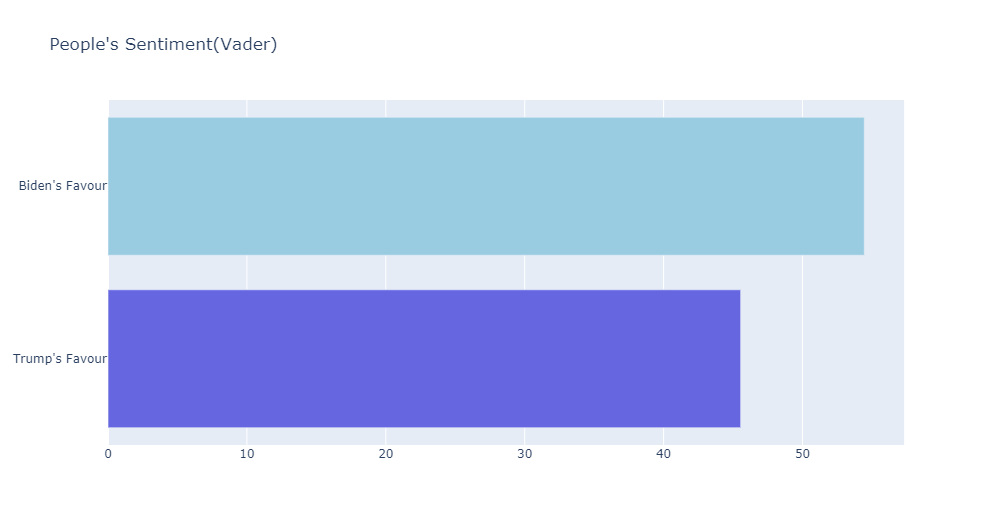

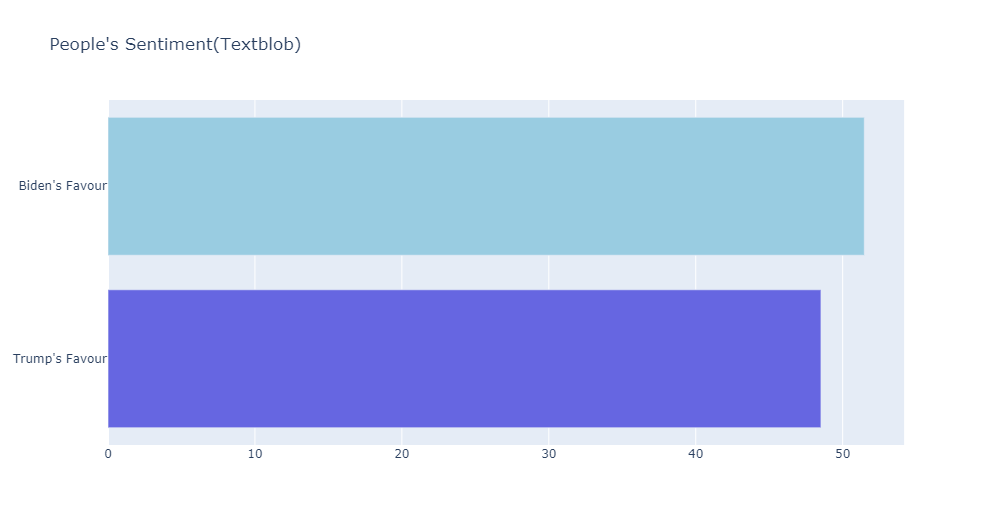

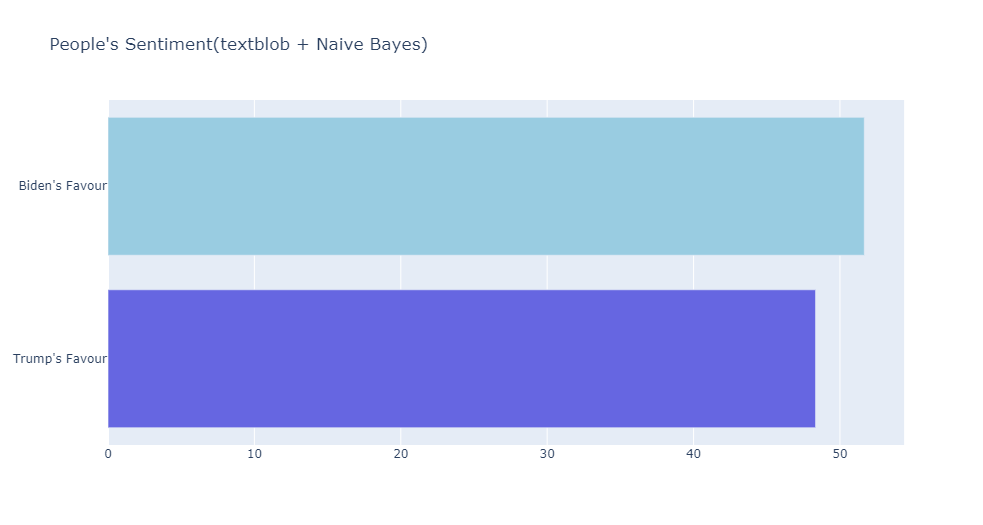

Vader
Biden:54.45% 
Trump:45.55% 

Textblob
Biden:51.475%
Trump:48.525%

Textblob + Naive Bayes
Biden:51.66429%
Trump:48.33571%

All three mehods give Biden the majority.Vader shows the higher majority compared to the other two methods for Biden but considering that Biden won by a majority of 51.3% to Trump's 46.8% both Textblob and Textblob with Naive Bayes is more appropriate for this study.

Source:https://www.nytimes.com/interactive/2020/11/03/us/elections/results-president.html